# Reading the data Dropbox

Dropbox link

In [0]:
!wget https://www.dropbox.com/s/6sejhpsip8ylpv7/sample.zip

--2019-03-01 23:06:26--  https://www.dropbox.com/s/6sejhpsip8ylpv7/sample.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.1, 2620:100:6021:1::a27d:4101
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/6sejhpsip8ylpv7/sample.zip [following]
--2019-03-01 23:06:26--  https://www.dropbox.com/s/raw/6sejhpsip8ylpv7/sample.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc2a21ba36f1dcb9733d6171a273.dl.dropboxusercontent.com/cd/0/inline/AcQHtphrJy4oKj0eM8iNQsGXz_9Xu-FX0cm4KCjPT1tRljfElt0eOXjAHCaoGMC87Nx6t5Ven21Xq9XB4LTyPkf3Ndnsf4JYE5FXhe9UkpVGUQ/file# [following]
--2019-03-01 23:06:27--  https://uc2a21ba36f1dcb9733d6171a273.dl.dropboxusercontent.com/cd/0/inline/AcQHtphrJy4oKj0eM8iNQsGXz_9Xu-FX0cm4KCjPT1tRljfElt0eOXjAHCaoGMC87Nx6t5Ven21Xq9XB4LTyPkf3Ndnsf4JYE5FXhe9UkpVGUQ/file
Resolving uc2a21ba36f1

In [0]:
#first time please unzip the file
!unzip "/content/gdrive/My Drive/sample.zip"

In [0]:
#@title Run this to import the right things
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import collections
import math
import os
import random
from six.moves import urllib
import io
import shutil

from IPython.display import clear_output, Image, display, HTML


import tensorflow as tf
import tensorflow_hub as hub

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import sklearn.metrics as sk_metrics
import time
from tensorflow.python.keras.applications.resnet50 import preprocess_input
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator

from keras.applications.inception_v3 import InceptionV3
from keras.applications.resnet50 import preprocess_input, decode_predictions, ResNet50
from keras.preprocessing import image
from keras import regularizers
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, BatchNormalization, Dropout, Flatten
from keras import backend as K

Using TensorFlow backend.


In [0]:
#@title Load the data set and split into test & train sets [RUN ME]
Pet_dir = './sample'
TRAIN_FRACTION = 0.8
RANDOM_SEED = 2018
print(os.listdir())



if not os.path.exists('./small_pet_photos_set__'):
    os.mkdir('./small_pet_photos_set__')


image_dir = Pet_dir
from sklearn.model_selection import train_test_split

# Read all flower images (.jpg) from a folder
# The function returns both the path of the flower image and the corresponding label
# which is defined by the name of the foler in which the image is
def read_images_from_dir(base_dir, folder):
    path_folder = os.path.join(image_dir, folder)
    files_directory = os.listdir(path_folder)
    
    labels = []
    images = []
    for file in files_directory:
        if file.endswith('.jpg'):
            labels.append(folder)
            images.append(os.path.join(path_folder, file))
    return labels, images

def read_images(base_dir):
    labels = []
    images = []
    folders = os.listdir(image_dir)
    for folder in folders:
        labels_folder, images_folder = read_images_from_dir(base_dir, folder)
        labels.extend(labels_folder)
        images.extend(images_folder)
    return labels, images

labels, images = read_images(image_dir)


# Split the data into test and training sets

images_train, images_test, labels_train, labels_test = train_test_split(images, labels, test_size=0.15, random_state=8, stratify=labels)
images_train, images_val, labels_train, labels_val = train_test_split(images_train, labels_train, test_size=0.20, random_state=8, stratify=labels_train)

# Create folders for test and training that can be passed to Keras Generators
train_folder = './small_pet_photos_set__/output/train'
test_folder  = './small_pet_photos_set__/output/test'
validation_folder ='./small_pet_photos_set__/output/val'
output_folder = './small_pet_photos_set__/output'

def create_output_folders():
    if not os.path.exists(output_folder):
        print('Creating output directories')
        os.mkdir(output_folder)
        if not os.path.exists(train_folder):
            os.mkdir(train_folder)
            for label in set(labels):
                os.mkdir(train_folder + '/' + label)
        if not os.path.exists(test_folder):
            os.mkdir(test_folder)
            for label in set(labels):
                os.mkdir(test_folder + '/' + label)
        if not os.path.exists(validation_folder):
            os.mkdir(validation_folder)
            for label in set(labels):
                os.mkdir(validation_folder + '/' + label)

def copy_files_to_train_and_validation_folders():            
    print('Copy training files to directory')
    for index, value in enumerate(images_train):
        dest = os.path.join(train_folder, labels_train[index])
        shutil.copy(value, dest)

    print('Copy test files to directory')        
    for index, value in enumerate(images_test):
        shutil.copy(value, test_folder + '/' + labels_test[index])
        
    # same for val
    for index, value in enumerate(images_val):
        shutil.copy(value, validation_folder + '/' + labels_val[index])
    
        
create_output_folders()
copy_files_to_train_and_validation_folders()

['.config', 'small_pet_photos_set__', 'sample', 'my.png', '.ipynb_checkpoints', 'gdrive', 'sample.zip', 'open?id=1gDEryt8YrUaFsK_LVEFMuDIoKCnSUn7y', 'sample_data']
Copy training files to directory
Copy test files to directory


# **Overview of Problem Analysis and Implementation**

Image classification is a fundamental problem in Machine/Deep Learning. Its applications are dynamic and widespread, including Face Recognition in social media networks, Self-Driven Cars and Augmented Reality.

For this assessment, I used a [dataset](http://www.robots.ox.ac.uk/~vgg/data/pets/) from Oxford University, which depicts Pets (Dogs and Cats). I used 4 categories from this dataset. In order to train a classifier for each category, I used the pre-trained model VGG16 from Keras to perform a fine-tuning process. Once these tasks were accomplished, I reviewed the results.

To begin with, I visualised the aforementioned dataset and plotted a sample of it using MatPLotLib from Python. Once the dataset had been plotted, I could identify the tasks I wanted the classifier to perform. Using these findings, I created a baseline model of a simple Neural Network (NN), which was then evaluated.

Furthermore, I implemented a simple Convolutional Neural Network (CNN), and then tested it. It was then expanded by adding 2 dense layers.

Once the aforementioned processes were completed, I introduced my pretrained model in order to implement the fine-tuned model. I also conducted 3 experiments: 
1. Adding a CNN on top of VGG16
2. Adding a 3 dense NN after VGG16
3. Removing the last layer of VGG16 and adding my classifier of 4 nodes

After performing these three tasks, a Grid-Search was conducted on the best model. Then, the best Hyperparameters were identified for the validation test.

Finally, I evaluated my best model with the best hyperparameters on the test set, which illustrated some significant statistic results.



**First statistics of the dataset**

800
[200, 200]


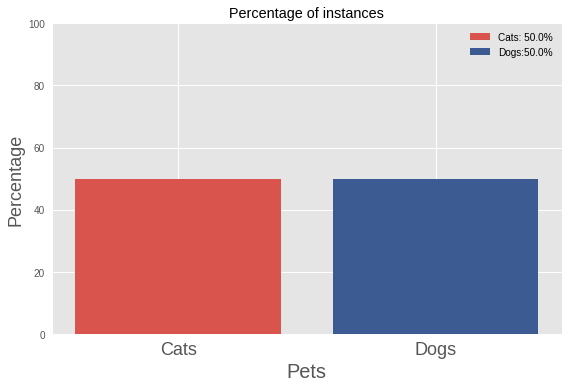

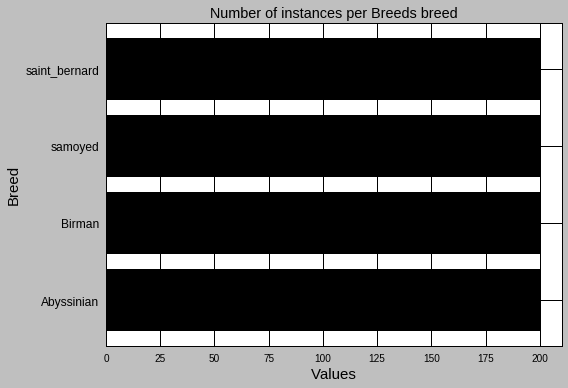

In [0]:
from collections import Counter
instances_of_each_category = Counter(labels)
categories_str = instances_of_each_category.keys()
categories_values = list(instances_of_each_category.values())
breeds = ['Abyssinian','Birman','samoyed', 'saint_bernard']
cats = ['Abyssinian','Birman']
dogs = ['samoyed', 'saint_bernard']
print(len(images))
temp_label = list(set(labels))
dogs = [animal for animal in temp_label if animal not in cats]
number_of_cats_instances =([instances_of_each_category[c] for c in cats])
print((number_of_cats_instances))
number_of_dogs_instances_per_breed =([instances_of_each_category[d] for d in dogs])
number_of_dogs_instances = len(images)- sum(number_of_cats_instances)
percentage_of_cats = (sum(number_of_cats_instances)/len(images)) *100.0

percentage_of_dogs = 100-percentage_of_cats
number_of_each_breed = number_of_cats_instances + number_of_dogs_instances_per_breed 


import matplotlib.pyplot as plt



def plot_bar_H(categories,values,title):
    # this is for plotting purpose
    plt.style.use('grayscale')
    index = np.arange(len(categories))
    plt.barh(index, values)
    plt.xlabel('Values', fontsize=15)
    plt.ylabel('Breed', fontsize=15)
    plt.yticks(index,categories,fontsize=12)
    plt.title('Number of instances per '+title+' breed')
    plt.tight_layout()
    plt.show()

def plot_bar_V(categories,values,title):
    # this is for plotting purpose
    plt.style.use('ggplot')
    index = np.arange(len(categories))
    plt.bar(index[0], values[0], color = sns.xkcd_rgb["pale red"], label='Cats: '+str(percentage_of_cats)+'%')
    plt.bar(index[1], values[1], color=sns.xkcd_rgb["denim blue"], label='Dogs:'+str(percentage_of_dogs)+'%')
    plt.xlabel('Pets', fontsize=20)
    plt.ylabel('Percentage', fontsize=18)
    plt.xticks(index, categories, fontsize=18)
    plt.ylim(0,100)
    plt.legend()
    plt.title('Percentage of instances'+title)
    plt.tight_layout()
    plt.show()
    
 
dogs_cats = ['Cats', 'Dogs']
plot_bar_V(dogs_cats,[percentage_of_cats, percentage_of_dogs],"")
plot_bar_H(breeds,number_of_each_breed, 'Breeds')


# **Image samples**

In [0]:
index_for_each_category=[]
for c in list(categories_str):
  index_for_each_category.append(labels.index(c))


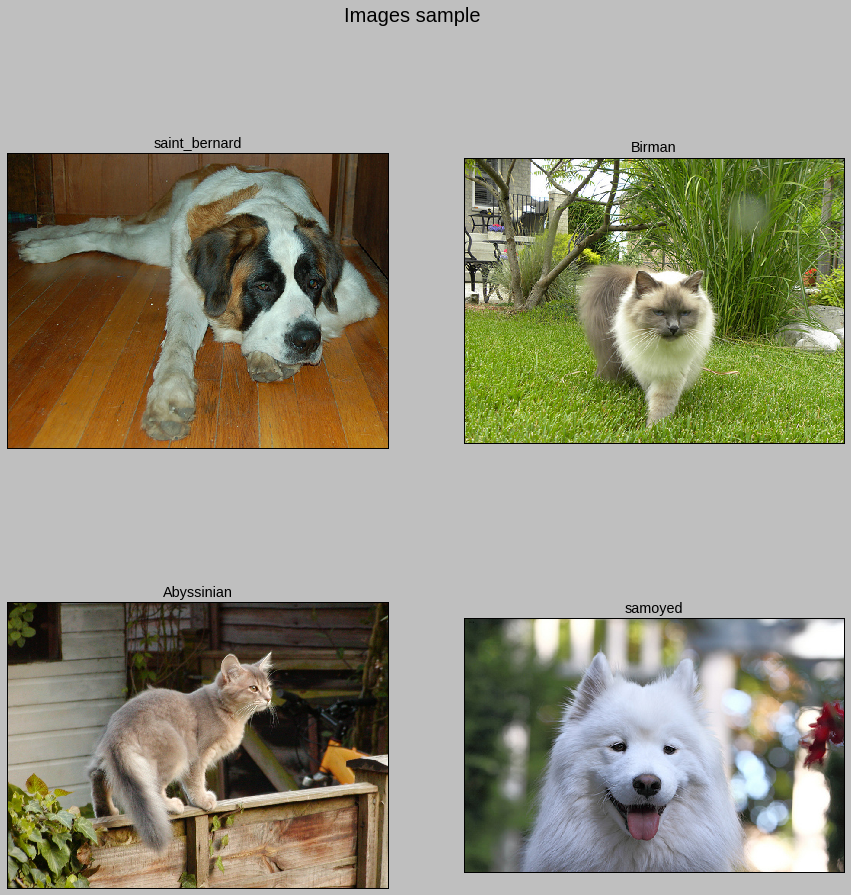

In [0]:
fig=plt.figure(figsize=(15, 15))
columns = 2
rows = 2
for i in range(1, columns*rows +1):
    img = mpimg.imread(images[index_for_each_category[i-1]])
    fig.add_subplot(rows, columns, i)
    plt.title(labels[index_for_each_category[i-1]])
    plt.imshow(img,interpolation='nearest')
    
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    if(i==4):
      break
plt.style.use('ggplot')
fig.suptitle("Images sample", size=20)
plt.grid(False)
plt.show()

In [0]:
image_size = 224
data_generator = ImageDataGenerator(rescale=1./255)

train_generator      = data_generator.flow_from_directory(train_folder, target_size=(image_size, image_size), batch_size=32, class_mode='categorical')

test_generator = data_generator.flow_from_directory(test_folder, target_size=(image_size, image_size), batch_size=10, class_mode='categorical')
validation_generator = data_generator.flow_from_directory(validation_folder, target_size=(image_size, image_size), batch_size=10, class_mode='categorical')



Found 544 images belonging to 4 classes.
Found 120 images belonging to 4 classes.
Found 136 images belonging to 4 classes.


# Simple Neural Network

For every Neural Network implementation I used categorical data and the softmax activation function for the classifying layer. I compiled my model with  'categorical crossentropy' as loss function and I used Adam algorithm as optimizer.

I chose this parameters after research.

In [0]:
from keras.layers import Flatten
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.models import Model
from keras.layers.convolutional import Conv2D
from keras import optimizers
from keras.layers import MaxPooling2D
import keras

vsimplenn = Sequential()
vsimplenn.add(Dense(128, activation='relu', input_shape=(224, 224, 3)))
vsimplenn.add(Dense(64, activation='relu'))
vsimplenn.add(Flatten())
vsimplenn.add(Dense(4, activation='softmax'))


In [0]:
vsimplenn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 224, 224, 128)     512       
_________________________________________________________________
dense_25 (Dense)             (None, 224, 224, 64)      8256      
_________________________________________________________________
flatten_3 (Flatten)          (None, 3211264)           0         
_________________________________________________________________
dense_26 (Dense)             (None, 4)                 12845060  
Total params: 12,853,828
Trainable params: 12,853,828
Non-trainable params: 0
_________________________________________________________________


In [0]:
vsimplenn.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(lr=0.0001, decay=0.0),
              metrics=['acc'])
     

In [0]:
history = vsimplenn.fit_generator(
      train_generator,
      steps_per_epoch=544/32,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=136/10,
      verbose=1)

Epoch 1/20
17/17 [==============================] - 6s 364ms/step - loss: 2.1387 - acc: 0.4853 - val_loss: 1.3558 - val_acc: 0.5441
Epoch 2/20
17/17 [==============================] - 6s 339ms/step - loss: 1.2962 - acc: 0.5809 - val_loss: 1.1374 - val_acc: 0.5662
Epoch 3/20
17/17 [==============================] - 6s 334ms/step - loss: 0.9297 - acc: 0.6213 - val_loss: 1.0550 - val_acc: 0.5588
Epoch 4/20
17/17 [==============================] - 6s 336ms/step - loss: 0.7517 - acc: 0.7004 - val_loss: 0.9726 - val_acc: 0.6176
Epoch 5/20
17/17 [==============================] - 6s 333ms/step - loss: 0.6808 - acc: 0.7188 - val_loss: 0.9609 - val_acc: 0.6765
Epoch 6/20
17/17 [==============================] - 6s 337ms/step - loss: 0.5519 - acc: 0.7886 - val_loss: 0.9188 - val_acc: 0.6838
Epoch 7/20
17/17 [==============================] - 6s 336ms/step - loss: 0.4308 - acc: 0.8658 - val_loss: 0.8723 - val_acc: 0.7206
Epoch 8/20
17/17 [==============================] - 6s 332ms/step - loss: 0.

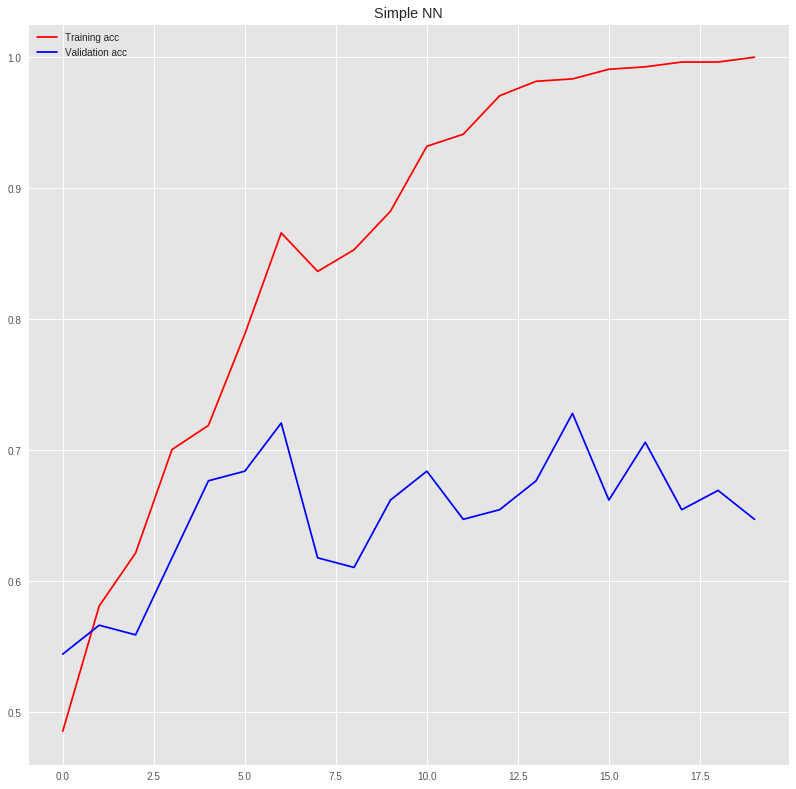

In [0]:
fig=plt.figure(figsize=(30, 30))
acc = history.history['acc']
val_acc =history.history['val_acc']
epochs = range(len(acc))
ax = fig.add_subplot(rows,columns,i)
ax.plot(epochs, acc, 'r', label='Training acc')
ax.plot(epochs, val_acc, 'b', label='Validation acc')
ax.set_title('Simple NN')
plt.legend()

The simple 2 dense layer NN predicts with 65-72% at the validation set. However we can try to create a CNN. Convolutional Neural Network is the fundamental mechanism for image classification.

# Wrong Predictions Sample

**Evaluation of our model on test set**

In [0]:
test_generator = data_generator.flow_from_directory(test_folder, target_size=(image_size, image_size), batch_size=10, class_mode='categorical', shuffle=False)

test_generator.reset()
predictions = vsimplenn.predict_generator(test_generator,steps=120/10)
predictions_c = np.argmax(predictions, axis=-1) #multiple categories
x_batch, y_batch = next(test_generator)

imagenames = test_generator.filenames
# print(imagenames)
true_labels= test_generator.classes

#print(test_generator.index_array)

classes = test_generator.classes[test_generator.index_array]


errors = np.where(classes != predictions_c)[0]
print("+#Errors: "+str(len(errors)))
accu_ = ((len(test_generator.index_array)-len(errors))/len(test_generator.index_array))
print("Accuracy: (#test-#errors)/#test = "+str(accu_))



Found 120 images belonging to 4 classes.
+#Errors: 45
Accuracy: (#test-#errors)/#test = 0.625


In [0]:
label_map = (test_generator.class_indices)
label_map = dict((v,k) for k,v in label_map.items()) 
predictions_ = [label_map[k] for k in predictions_c]
labels_test = [label_map[k] for k in test_generator.labels]
print(predictions_)
print(labels_test)

['saint_bernard', 'Abyssinian', 'Birman', 'Abyssinian', 'Abyssinian', 'saint_bernard', 'Abyssinian', 'Birman', 'Birman', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'samoyed', 'Abyssinian', 'Abyssinian', 'samoyed', 'saint_bernard', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Birman', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Birman', 'Abyssinian', 'saint_bernard', 'Birman', 'Birman', 'Birman', 'Abyssinian', 'Birman', 'saint_bernard', 'samoyed', 'saint_bernard', 'Birman', 'Abyssinian', 'Birman', 'samoyed', 'saint_bernard', 'Abyssinian', 'Abyssinian', 'samoyed', 'Birman', 'samoyed', 'Birman', 'saint_bernard', 'samoyed', 'Birman', 'Birman', 'samoyed', 'Birman', 'Birman', 'saint_bernard', 'Abyssinian', 'Birman', 'samoyed', 'saint_bernard', 'Abyssinian', 'samoyed', 'saint_bernard', 'samoyed', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'Abyssinian', 'saint_bernard', 'saint_bernard', 'Birman', 'Birman', 'Birman', 'saint_bernard', '

In [0]:
test_generator = data_generator.flow_from_directory(test_folder, target_size=(image_size, image_size), batch_size=120, class_mode='categorical', shuffle=False)
x_batch,y_batch = next(test_generator)

Found 120 images belonging to 4 classes.


In [0]:
 fig.add_subplot(rows, columns, i)
    plt.imshow(x_batch[i],interpolation='nearest')
    
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    if(i==4):
      break
plt.style.use('ggplot')
fig.suptitle("Augmented Images sample", size=20)
plt.grid(False)
plt.show()


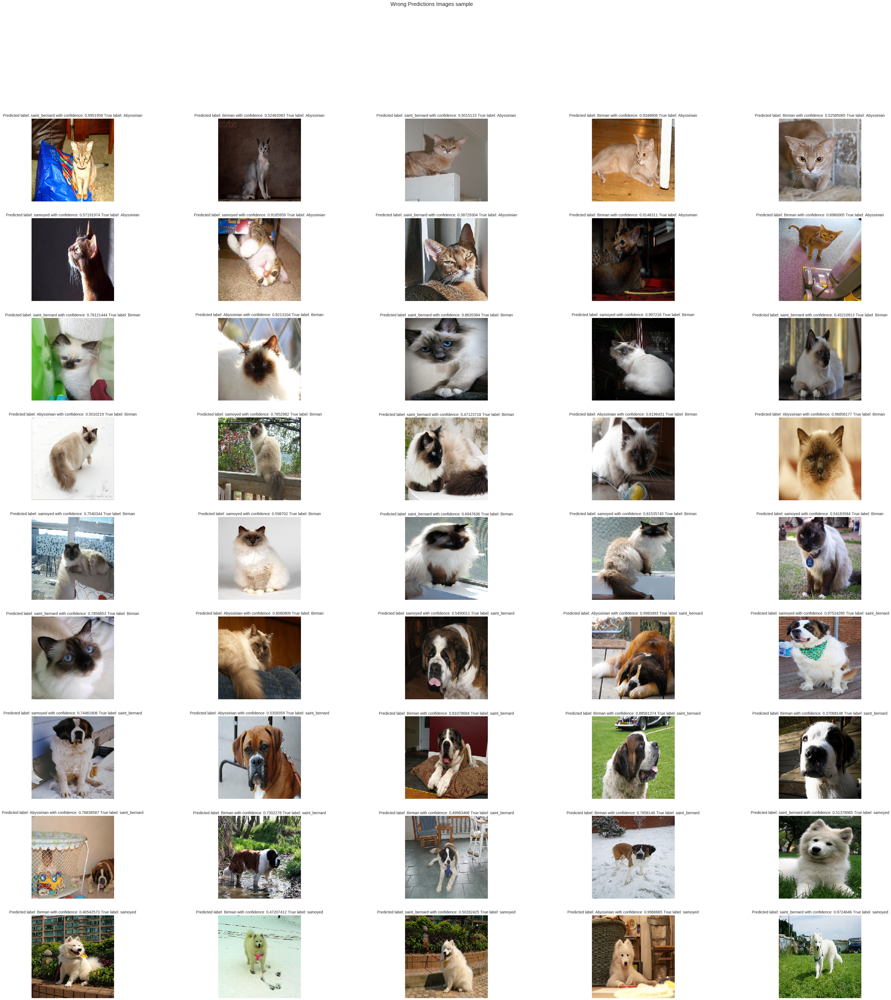

In [0]:
fig=plt.figure(figsize=(60, 60))
columns = 5
rows = 9

for i in range(len(errors)):
    iter_ = i+1
    fig.add_subplot(rows, columns, iter_)
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = label_map[pred_class]
    true_label = label_map[np.argmax(y_batch[errors[i]])]
    img = x_batch[errors[i]]
    prob = predictions[errors[i]][pred_class]
    title = 'Predicted label: '+str(pred_label)+' with confidence: '+str(prob)+' True label: '+str(true_label)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.title(title)
    plt.imshow(img,interpolation='nearest')
    plt.style.use('ggplot')

fig.suptitle("Wrong Predictions Images sample", size=20)
plt.grid(False)
plt.show()


# Our simple CNN

In [0]:
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.models import Model
from keras.layers.convolutional import Conv2D
from keras import optimizers
from keras.layers import MaxPooling2D
#model_vg16.summary()
import keras
image_size = 224
data_generator_simple = ImageDataGenerator(rescale=1./255)



simplenn = Sequential()
simplenn.add(Conv2D(32, (3, 3),  input_shape=(224, 224, 3)))

simplenn.add(MaxPooling2D(pool_size=(2, 2)))

simplenn.add(Conv2D(32, (3, 3)))
simplenn.add(Activation('relu'))
simplenn.add(MaxPooling2D(pool_size=(2, 2)))

simplenn.add(Conv2D(64, (3, 3)))
simplenn.add(Activation('relu'))
simplenn.add(MaxPooling2D(pool_size=(2, 2)))


simplenn.add(Flatten())  
simplenn.add(Dense(64))
simplenn.add(Activation('relu'))
simplenn.add(Dropout(0.5))
simplenn.add(Dense(128, activation='relu'))
simplenn.add(Dropout(0.25))
simplenn.add(Dense(4, activation='softmax'))



Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [0]:
simplenn.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(lr=0.0001, decay=0.0),
              metrics=['acc'])
     

In [0]:
 history = simplenn.fit_generator(
      train_generator,
      steps_per_epoch=544/16,
      epochs=45,
      validation_data=validation_generator,
      validation_steps=136/10,
      verbose=1)

Instructions for updating:
Use tf.cast instead.
Epoch 1/45
34/34 [==============================] - 11s 335ms/step - loss: 1.3834 - acc: 0.2684 - val_loss: 1.3699 - val_acc: 0.2868
Epoch 2/45
34/34 [==============================] - 7s 217ms/step - loss: 1.3620 - acc: 0.2748 - val_loss: 1.3487 - val_acc: 0.3235
Epoch 3/45
34/34 [==============================] - 7s 216ms/step - loss: 1.3242 - acc: 0.3208 - val_loss: 1.2888 - val_acc: 0.3456
Epoch 4/45
34/34 [==============================] - 7s 215ms/step - loss: 1.2815 - acc: 0.3539 - val_loss: 1.2244 - val_acc: 0.4853
Epoch 5/45
34/34 [==============================] - 7s 216ms/step - loss: 1.2132 - acc: 0.4338 - val_loss: 1.1370 - val_acc: 0.6103
Epoch 6/45
34/34 [==============================] - 7s 214ms/step - loss: 1.1221 - acc: 0.4798 - val_loss: 1.0416 - val_acc: 0.6103
Epoch 7/45
34/34 [==============================] - 7s 215ms/step - loss: 1.0545 - acc: 0.5515 - val_loss: 0.9941 - val_acc: 0.6544
Epoch 8/45
34/34 [=========

Our Model started to overfit 30th epoch. however 71,72 val_accuracy is not a bad score for this simple cnn.

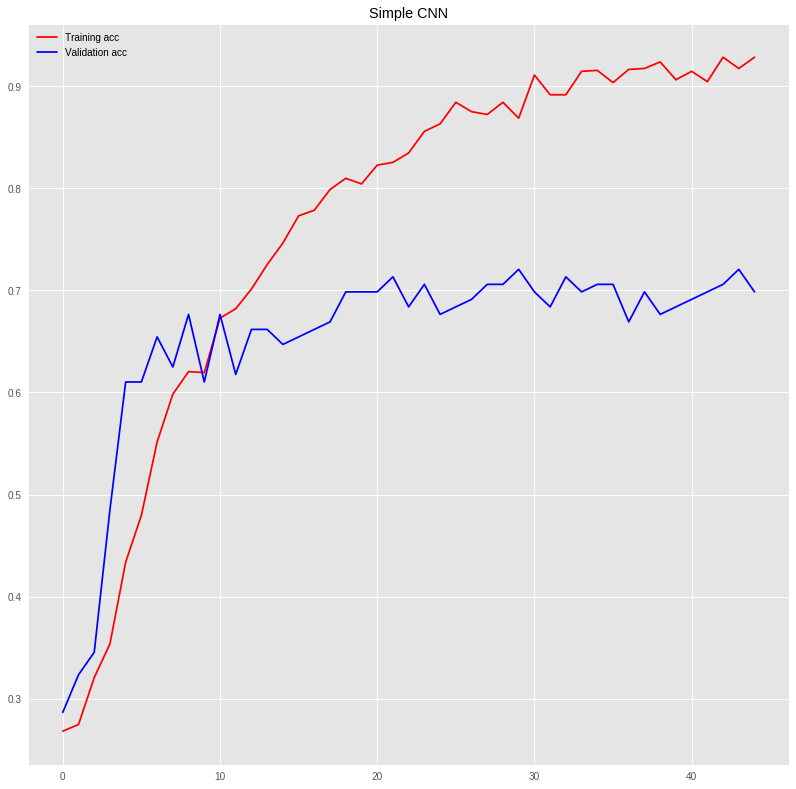

In [0]:
  fig=plt.figure(figsize=(30, 30))
  acc = history.history['acc']
  val_acc =history.history['val_acc']
  epochs = range(len(acc))
  ax = fig.add_subplot(rows,columns,i)
  ax.plot(epochs, acc, 'r', label='Training acc')
  ax.plot(epochs, val_acc, 'b', label='Validation acc')
  ax.set_title('Simple CNN')
  plt.legend()

# Simple CNN on top of vgg16(best)

We chose VGG16 as our pretrained model since it's a famous convolutional neural network from the University of Oxford and it is provided from [Keras](https://keras.io/applications/#vgg16). 
This model achieves very high accuracy in top test accuracy  Image datasets (ImageNet).

In [0]:
from keras.layers import Input
input_tensor = Input(shape=(224,224,3))
model_vg16 = keras.applications.vgg16.VGG16(weights='imagenet', include_top=False, input_tensor= input_tensor)
model_vg16.output_shape[1:]

(7, 7, 512)

In [0]:
my_cmodel = Sequential()
for layers in model_vg16.layers:
  my_cmodel.add(layers)


for layer in my_cmodel.layers:
  layer.trainable = False


In [0]:
my_cmodel.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)       295168    
__________

In [0]:
my_cmodel.add(Conv2D(32, (3, 3)))
my_cmodel.add(Activation('relu'))
my_cmodel.add(MaxPooling2D(pool_size=(2, 2)))

my_cmodel.add(Flatten())  
my_cmodel.add(Dense(128))
my_cmodel.add(Activation('relu'))
# i could use dropout but it's not a good idea for convolutional NN to remove features at random.
#my_cmodel.add(Dropout(0.25))
my_cmodel.add(Dense(64, activation='relu'))
#my_cmodel.add(Dropout(0.125))
my_cmodel.add(Dense(4, activation='softmax'))



In [0]:
my_cmodel.summary()

In [0]:
my_cmodel.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(lr=0.0001, decay=0.0),
              metrics=['acc'])

In [0]:
 history_ = my_cmodel.fit_generator(
      train_generator,
      steps_per_epoch=544/16,
      epochs=45,
      validation_data=validation_generator,
      validation_steps=136/10,
      verbose=1)

Epoch 1/45
34/34 [==============================] - 14s 401ms/step - loss: 1.2102 - acc: 0.5542 - val_loss: 1.0451 - val_acc: 0.7132
Epoch 2/45
34/34 [==============================] - 12s 353ms/step - loss: 0.7644 - acc: 0.8483 - val_loss: 0.6219 - val_acc: 0.8750
Epoch 3/45
34/34 [==============================] - 12s 354ms/step - loss: 0.4138 - acc: 0.9210 - val_loss: 0.3993 - val_acc: 0.8824
Epoch 4/45
34/34 [==============================] - 12s 354ms/step - loss: 0.2503 - acc: 0.9550 - val_loss: 0.2928 - val_acc: 0.9191
Epoch 5/45
34/34 [==============================] - 12s 353ms/step - loss: 0.1610 - acc: 0.9733 - val_loss: 0.2560 - val_acc: 0.9118
Epoch 6/45
34/34 [==============================] - 12s 354ms/step - loss: 0.1102 - acc: 0.9835 - val_loss: 0.2216 - val_acc: 0.9338
Epoch 7/45
34/34 [==============================] - 12s 354ms/step - loss: 0.0776 - acc: 0.9954 - val_loss: 0.2066 - val_acc: 0.9485
Epoch 8/45
34/34 [==============================] - 12s 354ms/step - 

**This is Our Best model with 94.85 at validation test. In a short time We will try to perform a Grid search to find the best parameters.**

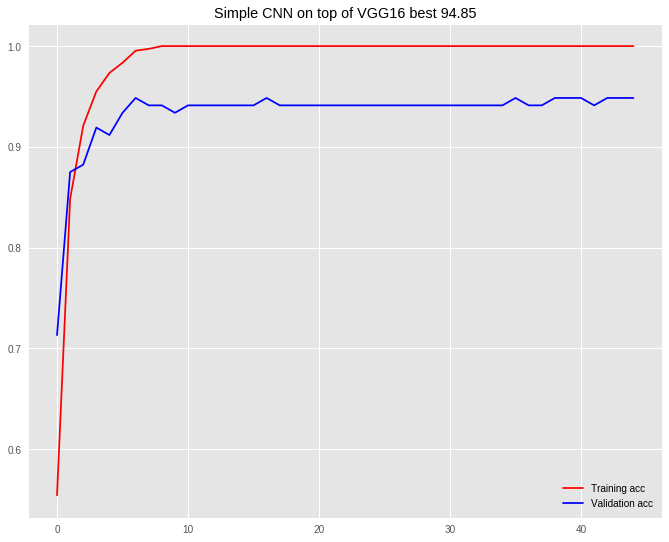

In [0]:
fig=plt.figure(figsize=(25, 20))
acc = history_.history['acc']
val_acc =history_.history['val_acc']
epochs = range(len(acc))
ax = fig.add_subplot(rows,columns,i)
ax.plot(epochs, acc, 'r', label='Training acc')
ax.plot(epochs, val_acc, 'b', label='Validation acc')
ax.set_title('Simple CNN on top of VGG16 best 94.85')
plt.legend()

# Adding 3 dense layers on top of VGG16

In [0]:
from keras.layers import Input
input_tensor = Input(shape=(224,224,3))
model_vg16 = keras.applications.vgg16.VGG16(weights='imagenet', include_top=False, input_tensor= input_tensor)


In [0]:
my_cmodel = Sequential()
for layers in model_vg16.layers:
  my_cmodel.add(layers)

  
for layer in my_cmodel.layers:
  layer.trainable = False

In [0]:
top_model = Sequential()
top_model.add(Flatten(input_shape= (7,7,512) ))
top_model.add(Dense(256, activation='relu'))
top_model.add(Dense(128, activation='relu'))
top_model.add(Dense(64, activation='relu'))
top_model.add(Dense(4, activation='softmax'))

In [0]:
my_cmodel.add(top_model)

In [0]:
my_cmodel.summary()

In [0]:
my_cmodel.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(lr=0.0001, decay=0.0),
              metrics=['acc'])

In [0]:
image_size = 224
data_generator_simple = ImageDataGenerator(rescale=1./255)

train_generator_simnple      = data_generator.flow_from_directory(train_folder, target_size=(image_size, image_size), batch_size=16, class_mode='categorical',shuffle=False)

test_generator = data_generator.flow_from_directory(test_folder, target_size=(image_size, image_size), batch_size=10, class_mode='categorical',shuffle=False)

validation_generator = data_generator.flow_from_directory(validation_folder, target_size=(image_size, image_size), batch_size=10, class_mode='categorical',shuffle=False)


Found 544 images belonging to 4 classes.
Found 120 images belonging to 4 classes.
Found 136 images belonging to 4 classes.


In [0]:


historyd= my_cmodel.fit_generator(
      train_generator,
      steps_per_epoch=544/16,
      epochs=45,
      validation_data=validation_generator,
      validation_steps=136/10,
      verbose=1)

Epoch 1/45
34/34 [==============================] - 14s 423ms/step - loss: 0.8350 - acc: 0.7031 - val_loss: 0.5143 - val_acc: 0.8162
Epoch 2/45
34/34 [==============================] - 12s 358ms/step - loss: 0.1780 - acc: 0.9752 - val_loss: 0.3511 - val_acc: 0.8750
Epoch 3/45
34/34 [==============================] - 12s 357ms/step - loss: 0.0539 - acc: 0.9982 - val_loss: 0.2841 - val_acc: 0.8971
Epoch 4/45
34/34 [==============================] - 12s 357ms/step - loss: 0.0224 - acc: 1.0000 - val_loss: 0.2563 - val_acc: 0.9044
Epoch 5/45
34/34 [==============================] - 12s 357ms/step - loss: 0.0120 - acc: 1.0000 - val_loss: 0.2448 - val_acc: 0.8971
Epoch 6/45
34/34 [==============================] - 12s 356ms/step - loss: 0.0076 - acc: 1.0000 - val_loss: 0.2487 - val_acc: 0.8971
Epoch 7/45
34/34 [==============================] - 12s 354ms/step - loss: 0.0052 - acc: 1.0000 - val_loss: 0.2377 - val_acc: 0.8971
Epoch 8/45
34/34 [==============================] - 12s 354ms/step - 

**The model started to converge at 10th epoch**

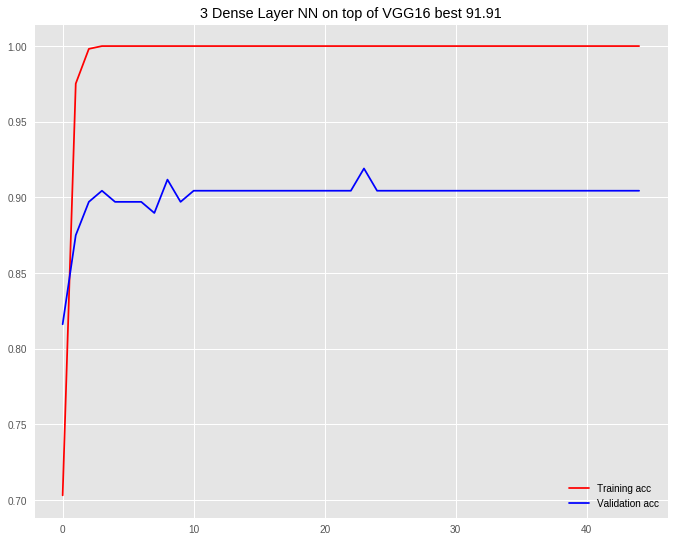

In [0]:
fig=plt.figure(figsize=(25, 20))
acc = historyd.history['acc']
val_acc =historyd.history['val_acc']
epochs = range(len(acc))
ax = fig.add_subplot(rows,columns,i)
ax.plot(epochs, acc, 'r', label='Training acc')
ax.plot(epochs, val_acc, 'b', label='Validation acc')
ax.set_title('3 Dense Layer NN on top of VGG16 best 91.91')
plt.legend()

# Just removing the last layer

In [0]:
from keras.layers import Input
input_tensor = Input(shape=(224,224,3))
model_vg16 = keras.applications.vgg16.VGG16(weights='imagenet', include_top=False, input_tensor= input_tensor)


In [0]:
my_model = Sequential()
for layers in model_vg16.layers:
  my_model.add(layers)

  
for layer in my_model.layers:
  layer.trainable = False

In [0]:
simple_classifier = Sequential()
simple_classifier.add(Flatten(input_shape= (7,7,512) ))
simple_classifier.add(Dense(4, activation='softmax'))

In [0]:
my_model.add(simple_classifier)

In [0]:
my_model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(lr=0.0001, decay=0.0),
              metrics=['acc'])


In [0]:
history__ = my_model.fit_generator(
      train_generator,
      steps_per_epoch=544/16,
      epochs=45,
      validation_data=validation_generator,
      validation_steps=136/10,
      verbose=1)

Epoch 1/45
34/34 [==============================] - 14s 417ms/step - loss: 1.0657 - acc: 0.6204 - val_loss: 0.8732 - val_acc: 0.7353
Epoch 2/45
34/34 [==============================] - 12s 352ms/step - loss: 0.6053 - acc: 0.9191 - val_loss: 0.6519 - val_acc: 0.8309
Epoch 3/45
34/34 [==============================] - 12s 352ms/step - loss: 0.4140 - acc: 0.9540 - val_loss: 0.5497 - val_acc: 0.8824
Epoch 4/45
34/34 [==============================] - 12s 351ms/step - loss: 0.3069 - acc: 0.9706 - val_loss: 0.4779 - val_acc: 0.8971
Epoch 5/45
34/34 [==============================] - 12s 351ms/step - loss: 0.2298 - acc: 0.9835 - val_loss: 0.4358 - val_acc: 0.8897
Epoch 6/45
34/34 [==============================] - 12s 351ms/step - loss: 0.1907 - acc: 0.9908 - val_loss: 0.4009 - val_acc: 0.8897
Epoch 7/45
34/34 [==============================] - 12s 353ms/step - loss: 0.1504 - acc: 0.9972 - val_loss: 0.3782 - val_acc: 0.8971
Epoch 8/45
34/34 [==============================] - 12s 352ms/step - 

**Our Model Converge at 24th epoch**

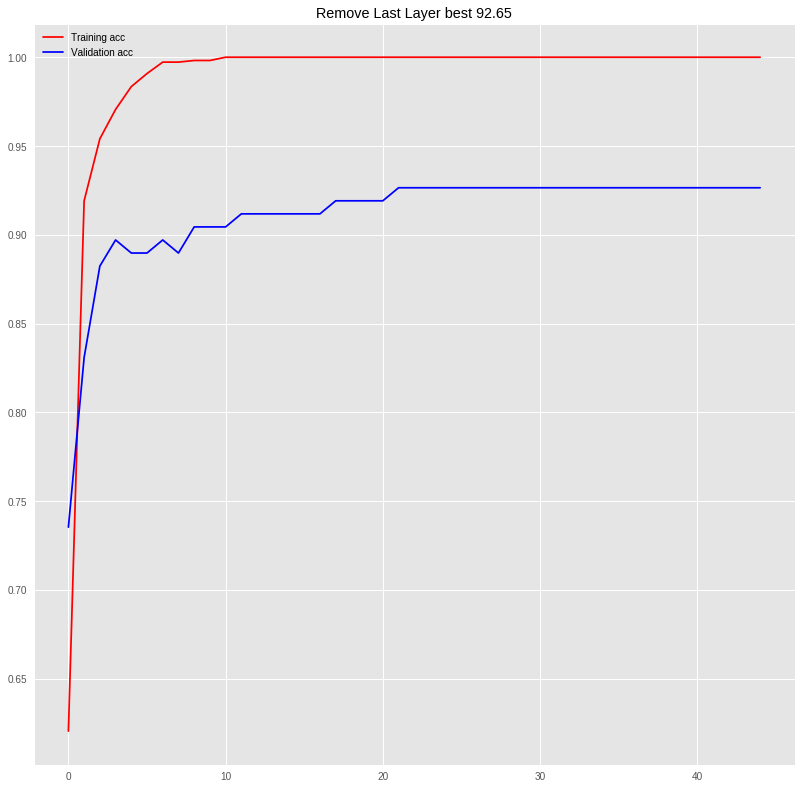

In [0]:
fig=plt.figure(figsize=(30, 30))
acc = history__.history['acc']
val_acc =history__.history['val_acc']
epochs = range(len(acc))
ax = fig.add_subplot(rows,columns,i)
ax.plot(epochs, acc, 'r', label='Training acc')
ax.plot(epochs, val_acc, 'b', label='Validation acc')
ax.set_title('Remove Last Layer best 92.65')
plt.legend()

#  Grid search at our best Model

In [0]:
from keras.layers import Input
input_tensor = Input(shape=(224,224,3))
model_vg16 = keras.applications.vgg16.VGG16(weights='imagenet', include_top=False, input_tensor= input_tensor)

In [0]:
list_history = []
info_list=[]
test_eval=[]
train_batches= [16,24,32]
learning_rates =[1e-3, 1e-4,1e-5]
data_generator = ImageDataGenerator(rescale=1./255)

i=0
for batch in train_batches:
      for lr_ in learning_rates:
        my_bmodel = Sequential()
        for layers in model_vg16.layers:
          my_bmodel.add(layers)
        for layer in my_cmodel.layers:
          layer.trainable = False
        my_bmodel.add(Conv2D(32, (3, 3)))
        my_bmodel.add(Activation('relu'))
        my_bmodel.add(MaxPooling2D(pool_size=(2, 2)))
        my_bmodel.add(Flatten())  
        my_bmodel.add(Dense(128))
        my_bmodel.add(Activation('relu'))
        # i could use dropout but it's not a good idea for convolutional NN to remove features at random.
        #my_cmodel.add(Dropout(0.25))
        my_bmodel.add(Dense(64, activation='relu'))
        #my_cmodel.add(Dropout(0.125))
        my_bmodel.add(Dense(4, activation='softmax'))

        # Lets compile

        my_bmodel.compile(loss='categorical_crossentropy',
                optimizer=optimizers.Adam(lr=lr_,decay=0.0),
                metrics=['acc'])
        # prepare the data
        train_generator      = data_generator.flow_from_directory(train_folder, target_size=(image_size, image_size), batch_size=batch, class_mode='categorical')
        validation_generator = data_generator.flow_from_directory(validation_folder, target_size=(image_size, image_size), batch_size=10, class_mode='categorical')


        history = my_bmodel.fit_generator(
        train_generator,
        steps_per_epoch=544/batch,
        epochs=45,
        validation_data=validation_generator,
        validation_steps=136/10,
        verbose=1)
        list_history.append(history)
        info_list.append("train batch value: "+str(batch)+" evaluation batch value: "+str(10)+" learning rate value: "+str(lr_))

Found 544 images belonging to 4 classes.
Found 136 images belonging to 4 classes.
Epoch 1/45
34/34 [==============================] - 9s 279ms/step - loss: 0.9345 - acc: 0.6121 - val_loss: 0.3658 - val_acc: 0.8971
Epoch 2/45
34/34 [==============================] - 7s 217ms/step - loss: 0.2621 - acc: 0.9081 - val_loss: 0.3828 - val_acc: 0.8456
Epoch 3/45
34/34 [==============================] - 7s 217ms/step - loss: 0.1037 - acc: 0.9706 - val_loss: 0.1848 - val_acc: 0.9485
Epoch 4/45
34/34 [==============================] - 7s 217ms/step - loss: 0.0392 - acc: 0.9926 - val_loss: 0.1747 - val_acc: 0.9412
Epoch 5/45
34/34 [==============================] - 7s 218ms/step - loss: 0.0134 - acc: 1.0000 - val_loss: 0.1808 - val_acc: 0.9338
Epoch 6/45
34/34 [==============================] - 7s 217ms/step - loss: 0.0052 - acc: 1.0000 - val_loss: 0.1876 - val_acc: 0.9338
Epoch 7/45
34/34 [==============================] - 7s 215ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 0.1882 - val_acc: 0

**best hyperparameters at validation set after Grid Search**

1.   Batch_training_value = 24
2.   learning_rate = 0.001



2
0.9485294038758558train batch value: 16 evaluation batch value: 10 learning rate value: 0.001
19
0.9117647067588919train batch value: 16 evaluation batch value: 10 learning rate value: 0.0001
44
0.8897058744640911train batch value: 16 evaluation batch value: 10 learning rate value: 1e-05
27
0.9558823476819431train batch value: 24 evaluation batch value: 10 learning rate value: 0.001
18
0.9485294038758558train batch value: 24 evaluation batch value: 10 learning rate value: 0.0001
44
0.904411759446649train batch value: 24 evaluation batch value: 10 learning rate value: 1e-05
36
0.9411764609463075train batch value: 32 evaluation batch value: 10 learning rate value: 0.001
26
0.9191176453057457train batch value: 32 evaluation batch value: 10 learning rate value: 0.0001
44
0.8602941158939811train batch value: 32 evaluation batch value: 10 learning rate value: 1e-05


Text(0.5, 0.98, 'Training and validation accuracy')

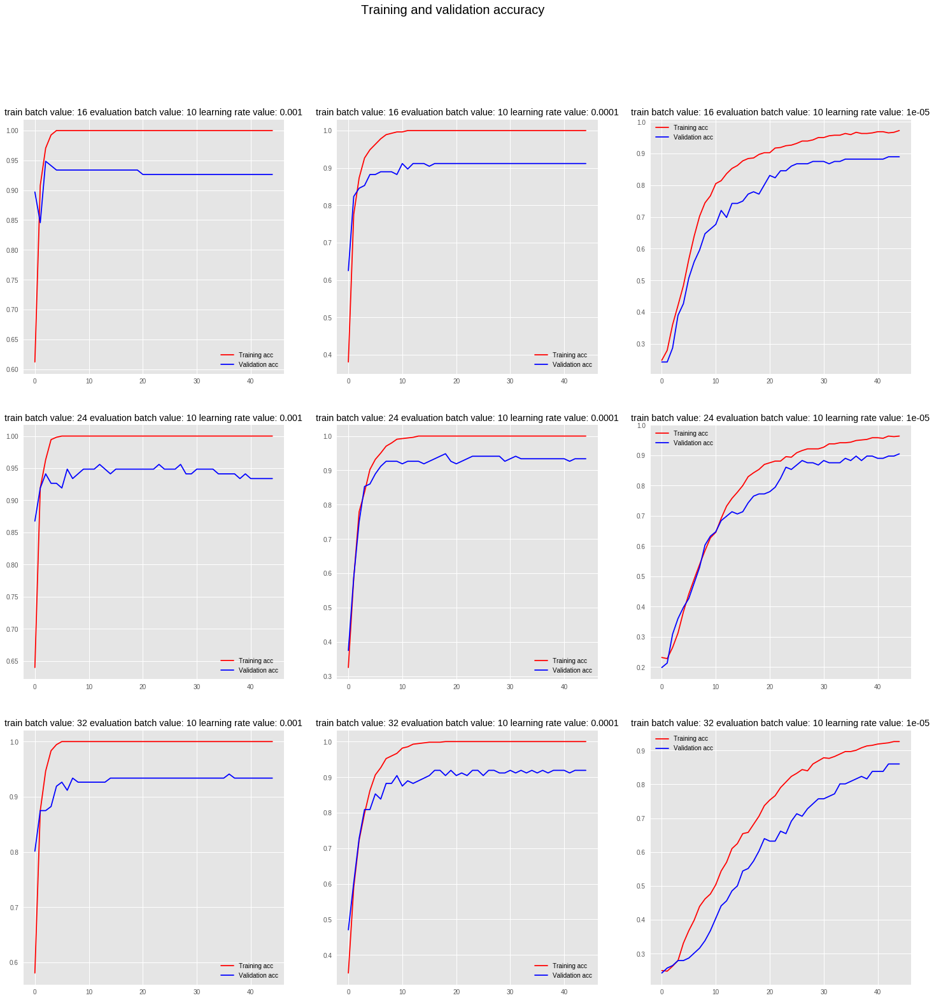

In [0]:
fig=plt.figure(figsize=(25, 25))
columns = 3
rows = 3
iter = (columns*rows +1)
max_ = 0
info_=""

for i in range(1, iter):
  acc = list_history[i-1].history['acc']
  val_acc = list_history[i-1].history['val_acc']
  loss = list_history[i-1].history['loss']
  val_loss = list_history[i-1].history['val_loss']
  max_val = max(val_acc)
  index =val_acc.index(max_val)
  print(index)
  print(str(max_val)+str(info_list[i-1]))
  epochs = range(len(acc))
  ax = fig.add_subplot(rows,columns,i)
  ax.plot(epochs, acc, 'r', label='Training acc')
  ax.plot(epochs, val_acc, 'b', label='Validation acc')
  ax.set_title(info_list[i-1])
  plt.legend()
  
  
  #85 val accuracy with batch normalisation

fig.suptitle("Training and validation accuracy", size=20)

# Predict and Stats of our Best Model

In [0]:
from keras.layers import Input
input_tensor = Input(shape=(224,224,3))
model_vg16 = keras.applications.vgg16.VGG16(weights='imagenet', include_top=False, input_tensor= input_tensor)

In [0]:
Final_Model = Sequential()
for layers in model_vg16.layers:
  Final_Model.add(layers)
for layer in Final_Model.layers:
  layer.trainable = False
  
Final_Model.add(Conv2D(32, (3, 3)))
Final_Model.add(Activation('relu'))
Final_Model.add(MaxPooling2D(pool_size=(2, 2)))
Final_Model.add(Flatten())  
Final_Model.add(Dense(128))
Final_Model.add(Activation('relu'))
# i could use dropout but it's not a good idea for convolutional NN to remove features at random.
#my_cmodel.add(Dropout(0.25))
Final_Model.add(Dense(64, activation='relu'))
#my_cmodel.add(Dropout(0.125))
Final_Model.add(Dense(4, activation='softmax'))

# Lets compile

Final_Model.compile(loss='categorical_crossentropy',
        optimizer=optimizers.Adam(lr=0.001,decay=0.0),
        metrics=['acc'])
# prepare the data
train_generator      = data_generator.flow_from_directory(train_folder, target_size=(image_size, image_size), batch_size=24, class_mode='categorical')
validation_generator = data_generator.flow_from_directory(validation_folder, target_size=(image_size, image_size), batch_size=10, class_mode='categorical')


history = Final_Model.fit_generator(
train_generator,
steps_per_epoch=544/24,
epochs=18,
validation_data=validation_generator,
validation_steps=136/10,
verbose=1)

Found 544 images belonging to 4 classes.
Found 136 images belonging to 4 classes.
Epoch 1/18
23/22 [==============================] - 12s 506ms/step - loss: 1.0701 - acc: 0.5634 - val_loss: 0.5986 - val_acc: 0.7500
Epoch 2/18
23/22 [==============================] - 8s 346ms/step - loss: 0.3948 - acc: 0.8477 - val_loss: 0.3894 - val_acc: 0.8456
Epoch 3/18
23/22 [==============================] - 8s 343ms/step - loss: 0.1390 - acc: 0.9637 - val_loss: 0.2156 - val_acc: 0.9191
Epoch 4/18
23/22 [==============================] - 8s 344ms/step - loss: 0.0446 - acc: 0.9927 - val_loss: 0.1825 - val_acc: 0.9412
Epoch 5/18
23/22 [==============================] - 8s 344ms/step - loss: 0.0203 - acc: 1.0000 - val_loss: 0.2100 - val_acc: 0.9632
Epoch 6/18
23/22 [==============================] - 8s 342ms/step - loss: 0.0099 - acc: 1.0000 - val_loss: 0.1613 - val_acc: 0.9559
Epoch 7/18
23/22 [==============================] - 8s 343ms/step - loss: 0.0050 - acc: 1.0000 - val_loss: 0.1651 - val_acc: 

In [0]:
test_generator = data_generator.flow_from_directory(test_folder, target_size=(image_size, image_size), batch_size=10, class_mode='categorical', shuffle=False)
b=Final_Model.evaluate_generator(test_generator, steps = 120/10)

Found 120 images belonging to 4 classes.


**Test Accuracy is 93.3% Lets create the Confusion Matrix**

In [0]:
b

[0.1909307760943193, 0.9333333273728689]

In [0]:
test_generator.reset()
predictions = Final_Model.predict_generator(test_generator,steps=120/10)
predictions = np.argmax(predictions, axis=-1) #multiple categories


imagenames = test_generator.filenames
# print(imagenames)
true_labels= test_generator.classes

#print(test_generator.index_array)

classes = test_generator.classes[test_generator.index_array]


errors = np.where(classes != predictions)[0]
print("+#Errors: "+str(len(errors)))
accu_ = ((len(test_generator.index_array)-len(errors))/len(test_generator.index_array))
print("Accuracy: (#test-#errors)/#test = "+str(accu_))




+#Errors: 8
Accuracy: (#test-#errors)/#test 0.9333333333333333
[0 0 0 0 0 3 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 3 2 2 2 2 2 2 2
 1 1 2 2 2 2 2 2 2 2 2 2 2 2 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 1 3 1 3]


In [0]:
print(test_generator.class_indices)
print(test_generator.labels)

{'Abyssinian': 0, 'Birman': 1, 'saint_bernard': 2, 'samoyed': 3}
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3]


In [0]:
label_map = (test_generator.class_indices)
label_map = dict((v,k) for k,v in label_map.items()) 
predictions_ = [label_map[k] for k in predictions]
labels_test = [label_map[k] for k in test_generator.labels]
print(predictions_)
print(labels_test)

['Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'samoyed', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Birman', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'samoyed', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'Birman', 'Birman', 'saint_bernard', 'saint_bernard', 

# Confusion Matrix

A confusion matrix is a  often used to describe and visualise the performance of a classification model (or "classifier", for our experiment is a CNN) on  test data which we generated from the dataset . Moreover CM will show at which particular classes our model get confused.

In [0]:
from sklearn.metrics import confusion_matrix
#SKLEARN DOCUMENTATION
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Reds):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()


Confusion matrix, without normalization
[[28  1  0  1]
 [ 0 30  0  0]
 [ 0  2 26  2]
 [ 0  2  0 28]]
Normalized confusion matrix
[[0.93 0.03 0.   0.03]
 [0.   1.   0.   0.  ]
 [0.   0.07 0.87 0.07]
 [0.   0.07 0.   0.93]]


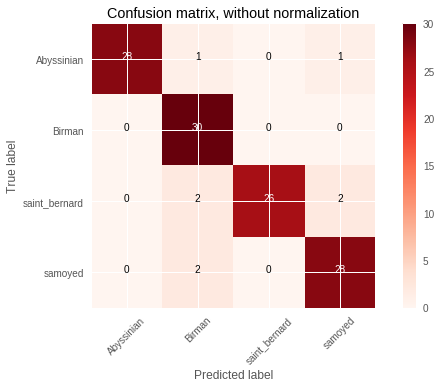

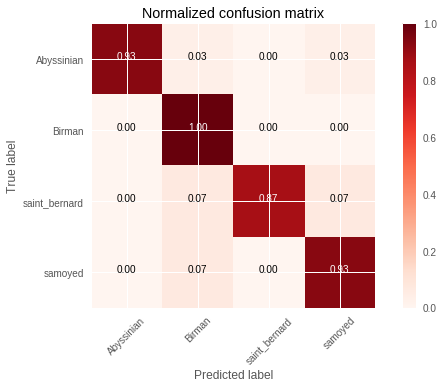

In [0]:
import itertools
cnf_matrix = confusion_matrix(labels_test, predictions_)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=list(test_generator.class_indices.keys()),
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=list(test_generator.class_indices.keys()), normalize=True,
                      title='Normalized confusion matrix')

plt.show()

Our Model is pretty accurate. The Confusion Matrix depicts valuable information. Birman Cat is predicted with 100% accuracy, Abyssian cat and Samoyed dog are predicted with 93% and Saint_Bernard is predicted with 87%

Our model Confused with the corect prediction of saint_bernard dog. 
It predicted 2 times a saint bernard dog as birman cat and 2 times as samoyed dog.

# Let's try some Data Augmentation for the best model that we chose from Grid Search

In [0]:
image_size = 224
data_generator_aug= ImageDataGenerator(
      rescale=1./255,
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      horizontal_flip=True,
      zoom_range=0.2,
      fill_mode='nearest')
 
validation_datagen = ImageDataGenerator(rescale=1./255)

from keras.layers import Input
input_tensor = Input(shape=(224,224,3))
model_vg16 = keras.applications.vgg16.VGG16(weights='imagenet', include_top=False, input_tensor= input_tensor)

aug_Final_Model = Sequential()
for layers in model_vg16.layers:
  aug_Final_Model.add(layers)
for layer in aug_Final_Model.layers:
  layer.trainable = False
  
aug_Final_Model.add(Conv2D(32, (3, 3)))
aug_Final_Model.add(Activation('relu'))
aug_Final_Model.add(MaxPooling2D(pool_size=(2, 2)))
aug_Final_Model.add(Flatten())  
aug_Final_Model.add(Dense(128))
aug_Final_Model.add(Activation('relu'))
# i could use dropout but it's not a good idea for convolutional NN to remove features at random.
#my_cmodel.add(Dropout(0.25))
aug_Final_Model.add(Dense(64, activation='relu'))
#my_cmodel.add(Dropout(0.125))
aug_Final_Model.add(Dense(4, activation='softmax'))

# Lets compile

aug_Final_Model.compile(loss='categorical_crossentropy',
        optimizer=optimizers.Adam(lr=0.001,decay=0.0),
        metrics=['acc'])
# prepare the data
train_generator      = data_generator_aug.flow_from_directory(train_folder, target_size=(image_size, image_size), batch_size=24, class_mode='categorical')
validation_generator = data_generator.flow_from_directory(validation_folder, target_size=(image_size, image_size), batch_size=10, class_mode='categorical')


history = aug_Final_Model.fit_generator(
train_generator,
steps_per_epoch=544/24,
epochs=18,
validation_data=validation_generator,
validation_steps=136/10,
verbose=1)

Found 544 images belonging to 4 classes.
Found 136 images belonging to 4 classes.
Epoch 1/18
23/22 [==============================] - 15s 651ms/step - loss: 1.1616 - acc: 0.4828 - val_loss: 0.8828 - val_acc: 0.5515
Epoch 2/18
23/22 [==============================] - 11s 491ms/step - loss: 0.6228 - acc: 0.7517 - val_loss: 0.3272 - val_acc: 0.9118
Epoch 3/18
23/22 [==============================] - 12s 509ms/step - loss: 0.3605 - acc: 0.8714 - val_loss: 0.3176 - val_acc: 0.8603
Epoch 4/18
23/22 [==============================] - 12s 508ms/step - loss: 0.3235 - acc: 0.8831 - val_loss: 0.2885 - val_acc: 0.8971
Epoch 5/18
23/22 [==============================] - 12s 507ms/step - loss: 0.2882 - acc: 0.8922 - val_loss: 0.2166 - val_acc: 0.9265
Epoch 6/18
23/22 [==============================] - 12s 503ms/step - loss: 0.2053 - acc: 0.9384 - val_loss: 0.1859 - val_acc: 0.9338
Epoch 7/18
23/22 [==============================] - 12s 510ms/step - loss: 0.1915 - acc: 0.9239 - val_loss: 0.2216 - val

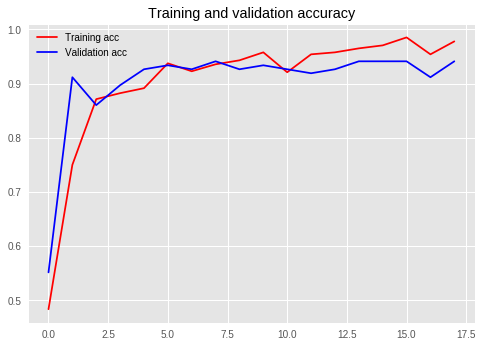

<Figure size 576x396 with 0 Axes>

In [0]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()


#85 val accuracy with batch normalisation
plt.show()

In [0]:
test_generator = data_generator.flow_from_directory(test_folder, target_size=(image_size, image_size), batch_size=10, class_mode='categorical', shuffle=False)
augment=aug_Final_Model.evaluate_generator(test_generator, steps = 120/10)

In [0]:
print(augment)

[0.07668278191340505, 0.9666666636864344]


In [0]:
test_generator.reset()
predictions = aug_Final_Model.predict_generator(test_generator,steps=120/10)
predictions = np.argmax(predictions, axis=-1) #multiple categories


imagenames = test_generator.filenames
# print(imagenames)
true_labels= test_generator.classes

#print(test_generator.index_array)

classes = test_generator.classes[test_generator.index_array]


errors = np.where(classes != predictions)[0]
print("+#Errors: "+str(len(errors)))
accu_ = ((len(test_generator.index_array)-len(errors))/len(test_generator.index_array))
print("Accuracy: (#test-#errors)/#test = "+str(accu_))

+#Errors: 4
Accuracy: (#test-#errors)/#test = 0.9666666666666667


In [0]:
label_map = (test_generator.class_indices)
label_map = dict((v,k) for k,v in label_map.items()) 
predictions_ = [label_map[k] for k in predictions]
labels_test = [label_map[k] for k in test_generator.labels]
print(predictions_)
print(labels_test)

['Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'saint_bernard', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Abyssinian', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'Birman', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'samoyed', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_bernard', 'saint_ber

Confusion matrix, without normalization
[[29  0  1  0]
 [ 0 30  0  0]
 [ 0  0 29  1]
 [ 1  1  0 28]]
Normalized confusion matrix
[[0.97 0.   0.03 0.  ]
 [0.   1.   0.   0.  ]
 [0.   0.   0.97 0.03]
 [0.03 0.03 0.   0.93]]


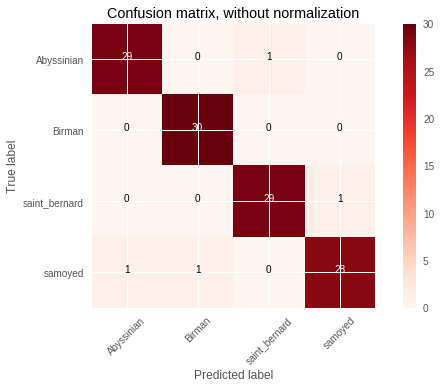

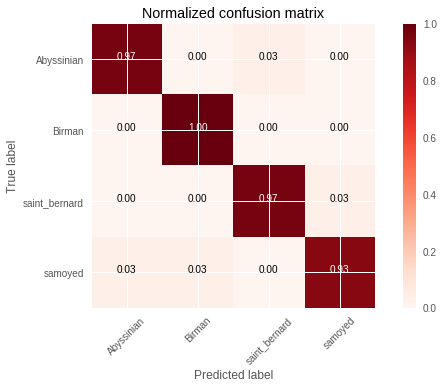

In [0]:
import itertools
cnf_matrix = confusion_matrix(labels_test, predictions_)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=list(test_generator.class_indices.keys()),
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=list(test_generator.class_indices.keys()), normalize=True,
                      title='Normalized confusion matrix')

plt.show()

Our model is more accurate. The model without data augmentation had 8 errors and with data augmentation it predicted wrong only 4 times.

This model imroved the Saint bernard classifier (only 1 wrong prediction). 
The remaining classifiers remained their accuracy.

Found 544 images belonging to 4 classes.


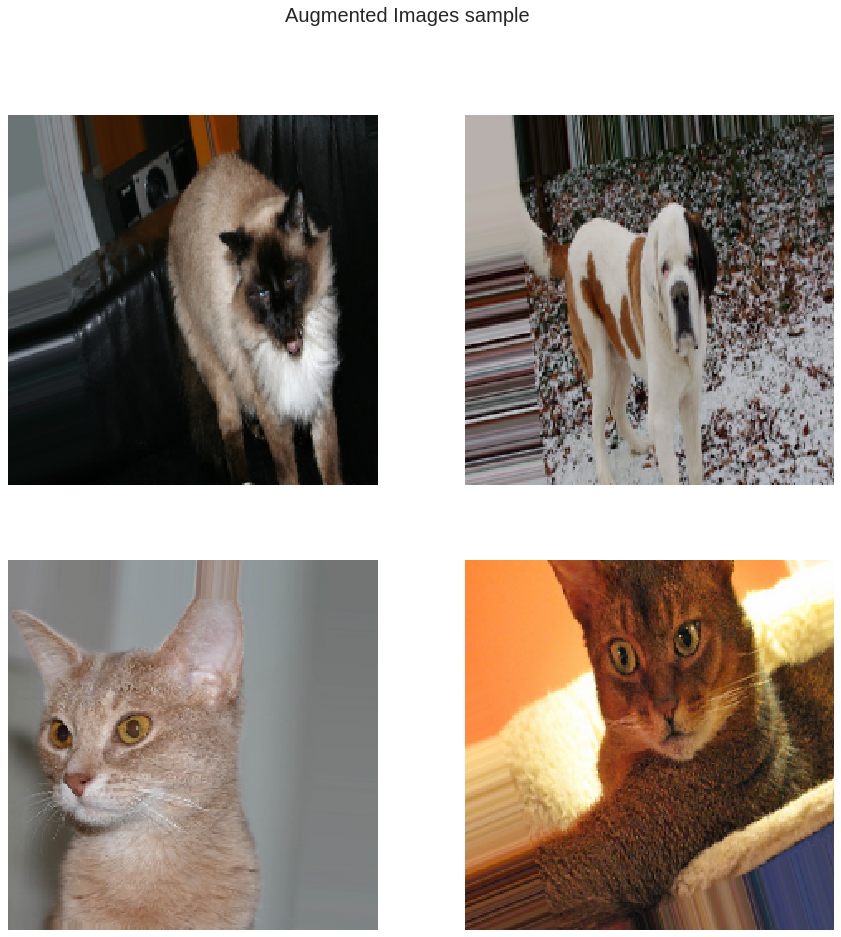

In [0]:
data_generator_aug= ImageDataGenerator(
      rescale=1./255,
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      horizontal_flip=True,
      zoom_range=0.2,
      fill_mode='nearest')
batches = data_generator_aug.flow_from_directory(train_folder, target_size=(image_size, image_size), batch_size=24, class_mode='categorical')
x_batch, y_batch = next(batches)

fig=plt.figure(figsize=(15, 15))
columns = 2
rows = 2
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    plt.imshow(x_batch[i],interpolation='nearest')
    
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    if(i==4):
      break
plt.style.use('ggplot')
fig.suptitle("Augmented Images sample", size=20)
plt.grid(False)
plt.show()




# Final Evaluation

# **Results and Conclusion**
The experiments showed that can fairly predict the target classes. Details are as follow:
1. The very simple NN scored an evaluation accuracy of 65-72%
2. The simple CNN achieved evaluation accuracy of 72%

Furthermore, the fine-tuned models achieved a high validation accuracy:
1. The modified VGG16 model with our classifier(4 classes rather than 1000) achieved validation accuracy of 92.65%.
2. The VGG16 model with 3 Dense layers scored 90.44% on validation set.

Finally, the VGG16 model with a simple CNN, using data augmentation techniques, achieved:
1. 94.85% on validation set
2. 96.6% accuracy on the test set

After conducting the experiments and evaluating the results, I chose fine-tuned VGG16 model with a simple CNN on top as my best model.

The chosen model can perform really well and can be applied to image classification tasks. Examples include applications that can describe a breed by uploading a photo, and applications which help people to find missing pets.